<a href="https://colab.research.google.com/github/JacquiePersha/BuildingPermits/blob/main/Copy_of_01_transfer_learning(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Objective

Discuss the central ideas of transfer learning and model training.

**Preliminaries**

In [ ]:
! pip install --quiet session-info tensorboard-plugin-profile

In [ ]:
import session_info
import numpy as np
import tensorflow as tf
import tensorflow_datasets as tfds

import matplotlib.pyplot as plt

from io import BytesIO
from urllib.request import urlopen
from zipfile import ZipFile

from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVC
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import (
    RandomizedSearchCV,
    cross_validate
)

from scipy.stats import reciprocal, uniform

In [ ]:
#session_info.show() #Original but has an error
session_info.show(dependencies=False)

# Introduction

Transfer learning is typically used in situations where we have of the order of thousands of examples. Through transfer learning we 'transfer' the weights learned by state-of-the-art neural networks on large scale data sets (e.g., Imagenet) as base models. These weights are used directly to make predictions by adding a few dense layers at the end of the base models. To begin with, we train only the dense layers and if the observed accuracy is low, we retrain the base network weights using a low learning rate.

The idea here is that some convolutional neural network architectures (e.g., VGG16, ResNet50, EfficientNet) could be used as feature extractors that can be used across different domains.

The ResNet50 architecture is an excellent starting point for a wide variety of transfer learning tasks. We focus on illustrating the methodology to conduct transfer learning with this architecture in this notebook.

# Data

While we will reply on deep convolutional neural networks to extract features from images with minimal processing, exploratory data analysis is still relevant so we are aware of peculiar patterns on the data. Let us begin by creating an image data set.

Image data sets are typically organized into training, validation and testing directories, where each of these directories contains subfolders with images corresponding to each of the classes in the data set.

```
project
│   README.md
└───train
│   └───class1
│       │   tr_image11.jpg
│       │   tr_image12.jpg
│       │   ...
|   └───class2
│       │   tr_image21.jpg
│       │   tr_image22.jpg
│       │   ...
└───validation
│   └───class1
│       │   val_image11.jpg
│       │   val_image12.jpg
│       │   ...
|   └───class2
│       │   val_image21.jpg
│       │   val_image22.jpg
│       │   ...
```

The dataset will use to illustrate key ideas of transfer learning is the [Ibean Leaf dataset](https://github.com/AI-Lab-Makerere/ibean/).

The dataset contains leaf images taken in the field in different districts in Uganda by the Makerere AI lab in collaboration with the National Crops Resources Research Institute (NaCRRI), the national body in charge of research in agriculture in Uganda. Beans are an important cereal food crop for Africa grown by many small-holder farmers and are a significant source of proteins for school-age going children in East Africa.

There are 3 classes of leaf images in the dataset:
 - Healthy
 - Angular Leaf Spot disease
 - Bean Rust disease

The input data includes example leaf images taken in the field/garden using a basic smartphone.

The images were then annotated by experts from NaCRRI who determined for each image which disease was manifested. The experts were part of the data collection team and images were annotated directly during the data collection process in the field.

Let us now download the images and sort them into folders named by class.

In [ ]:
train_data_url = 'https://storage.googleapis.com/ibeans/train.zip'
validation_data_url = 'https://storage.googleapis.com/ibeans/validation.zip'
test_data_url = 'https://storage.googleapis.com/ibeans/test.zip'

In [ ]:
with urlopen(train_data_url) as zipped_file:
    with ZipFile(BytesIO(zipped_file.read())) as zfile:
        zfile.extractall('/tmp/bean')

In [ ]:
with urlopen(validation_data_url) as zipped_file:
    with ZipFile(BytesIO(zipped_file.read())) as zfile:
        zfile.extractall('/tmp/bean')

In [ ]:
with urlopen(test_data_url) as zipped_file:
    with ZipFile(BytesIO(zipped_file.read())) as zfile:
        zfile.extractall('/tmp/bean')

In [ ]:
TRAINING_DIR = '/tmp/bean/train'
VALIDATION_DIR = '/tmp/bean/validation'
TEST_DIR = '/tmp/bean/test'

BATCH_SIZE = 16

IMAGE_SIZE = (224, 224)

Note how we are also freezing the batch size to be 16 here. This is a good general starting point, but batch size should be reduced or increased depending on the performance of the model. However, batch size more than 32 is not a good idea.

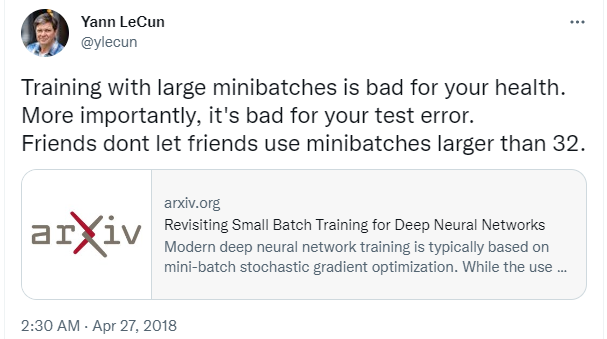

To create an image data set from a directory of images with images of each class in a subfolder, we use the [`image_dataset_from_directory`](https://www.tensorflow.org/api_docs/python/tf/keras/utils/image_dataset_from_directory) function.

In [ ]:
help(tf.keras.preprocessing.image_dataset_from_directory)

Help on function image_dataset_from_directory in module keras.src.utils.image_dataset_utils:

image_dataset_from_directory(directory, labels='inferred', label_mode='int', class_names=None, color_mode='rgb', batch_size=32, image_size=(256, 256), shuffle=True, seed=None, validation_split=None, subset=None, interpolation='bilinear', follow_links=False, crop_to_aspect_ratio=False, pad_to_aspect_ratio=False, data_format=None, verbose=True)
    Generates a `tf.data.Dataset` from image files in a directory.
    
    If your directory structure is:
    
    ```
    main_directory/
    ...class_a/
    ......a_image_1.jpg
    ......a_image_2.jpg
    ...class_b/
    ......b_image_1.jpg
    ......b_image_2.jpg
    ```
    
    Then calling `image_dataset_from_directory(main_directory,
    labels='inferred')` will return a `tf.data.Dataset` that yields batches of
    images from the subdirectories `class_a` and `class_b`, together with labels
    0 and 1 (0 corresponding to `class_a` and 1 correspo

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 1034 files belonging to 3 classes.


Observe how we are passing the label mode to be `categorical`. This ensures that the labels are one-hot encoded. We are also ensuring that the images in the dataset are shuffled randomly during the training process.

The same preprocessing steps are executed for the validation data and the test data.

In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=VALIDATION_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 133 files belonging to 3 classes.


In [ ]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 128 files belonging to 3 classes.


## Exploratory Data Analysis

Let us begin with a basic EDA of the images in our dataset. To iterate through the Dataset object by batch, we use the `take` method.

In [ ]:
help(train_ds.take)

Help on method take in module tensorflow.python.data.ops.dataset_ops:

take(count, name=None) -> 'DatasetV2' method of tensorflow.python.data.ops.prefetch_op._PrefetchDataset instance
    Creates a `Dataset` with at most `count` elements from this dataset.
    
    >>> dataset = tf.data.Dataset.range(10)
    >>> dataset = dataset.take(3)
    >>> [a.item() for a in dataset.as_numpy_iterator()]
    [0, 1, 2]
    
    Args:
      count: A `tf.int64` scalar `tf.Tensor`, representing the number of
        elements of this dataset that should be taken to form the new dataset.
        If `count` is -1, or if `count` is greater than the size of this
        dataset, the new dataset will contain all elements of this dataset.
      name: (Optional.) A name for the tf.data operation.
    
    Returns:
      A new `Dataset` with the transformation applied as described above.



In [ ]:
class_names = np.array(train_ds.class_names)

In [ ]:
class_names

array(['angular_leaf_spot', 'bean_rust', 'healthy'], dtype='<U17')

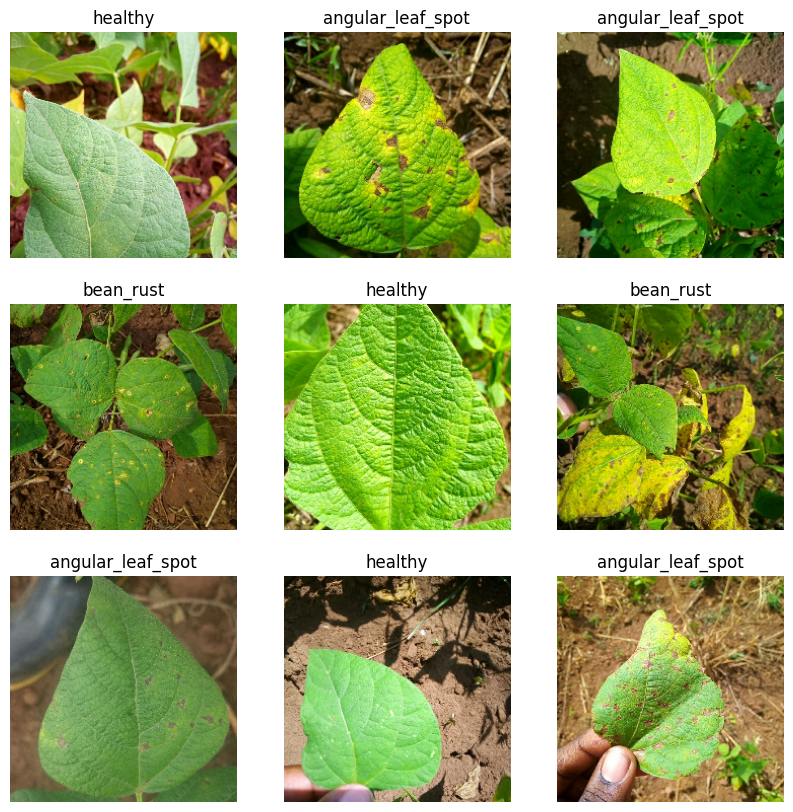

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[np.argmax(labels[i])])
        plt.axis("off")

The preliminary EDA already throws up several inconsistencies in the images (e.g., viewport variations, foreign objects, exposure variations).

In [ ]:
images.shape, labels.shape

(TensorShape([16, 224, 224, 3]), TensorShape([16, 3]))

>**Question: Why is the shape of labels `(16, 3)`?**

## Points to remember

1. During EDA, we are estimating the extent of:
- Missing/malformed images (solution: delete)
- Noisy images (solution: image augmentation)
- Viewport variations (solution: image augmentation)

2. Good training data sets are representative of the images the model will see in production. Having a good validation data set is equally important.

Image augmentation is a key component of ensuring we have a quality data set. This is a crucial step that is sometimes handled during the training process. However, given the importance of data augmentation, we will look at this idea more deeply in a separate notebook.

A key benefit of deep learning is the minimal reliance on preprocessing. Our path to a model ready for production will progress in two steps. First, we will develop a set of baselines by training large convolutional architectures on the data set. Second, we will augment the data and train the CNNs again on this augmented data set. This approach will also allow us to get a concrete idea of impact of data augmentation on model performance.

The bottom line is that data augmentation is not a footnote but a crucial step that directly improves the accuracy of the model.

# A SVM baseline


Before training a CNN, it is good practise to estimate a baseline accuracy from a non deep learning approach. We might discover that the requried accuracy is achieved through vanilla machine learning methods obviating the need for a time consuming model development process.

Let us now train a Support Vector Machine (SVM) on the data. We will not conduct any preprocessing beyond scaling the features and reducing the image size to (56, 56). Recall that SVMs are powerful when we have less than 5000 examples and an abundance of possibly correlated, sparse features.

In [ ]:

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=(56, 56),
    shuffle=True,
    seed=42
)

Found 1034 files belonging to 3 classes.


Let us convert this TensorFlow `tf.Data` object to a numpy object so we can use `scikit` estimators.

In [ ]:
train_data = tfds.as_numpy(train_ds)

In [ ]:
Xtrain, ytrain = [], []

In [ ]:
for images_batch, labels_batch in train_data:
    Xtrain.append(images_batch.reshape(len(images_batch), -1))
    for labels in labels_batch:
        ytrain.append(np.argmax(labels))

In [ ]:
Xtrain = np.vstack(Xtrain)
ytrain = np.array(ytrain)

Note how we are reshaping the image batches to flatten them and finally stacking the batches to assemble the data set. At the end of this process, each row in the data set corresponds to an image and the columns correspond to the pixel values.

In [ ]:
Xtrain.shape, ytrain.shape

((1034, 9408), (1034,))

> **Question: Why does `Xtrain` have 9408 columns?**

Let us now repeat the same flattening process for the validation and test data.

In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=VALIDATION_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=(56, 56),
    shuffle=True,
    seed=42
)

Found 133 files belonging to 3 classes.


In [ ]:
val_data = tfds.as_numpy(val_ds)

In [ ]:
Xval, yval = [], []

In [ ]:
for images_batch, labels_batch in val_data:
    Xval.append(images_batch.reshape(len(images_batch), -1))
    for labels in labels_batch:
        yval.append(np.argmax(labels))

In [ ]:
Xval = np.vstack(Xval)
yval = np.array(yval)

In [ ]:
Xval.shape, yval.shape

((133, 9408), (133,))

In [ ]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=(56, 56),
    shuffle=True,
    seed=42
)

Found 128 files belonging to 3 classes.


In [ ]:
test_data = tfds.as_numpy(test_ds)

In [ ]:
Xtest, ytest = [], []

In [ ]:
for images_batch, labels_batch in test_data:
    Xtest.append(images_batch.reshape(len(images_batch), -1))
    for labels in labels_batch:
        ytest.append(np.argmax(labels))

In [ ]:
Xtest = np.vstack(Xtest)
ytest = np.array(ytest)

In [ ]:
Xtest.shape, ytest.shape

((128, 9408), (128,))

## Baseline

Now that we have the data in shape to be fed to a model, let us estimate a SVM with the default parameters of `scikit` to get a sense of the baseline.

In [ ]:
model_svm = SVC(kernel='rbf',
                C=1.0,
                gamma='scale',
                random_state=42)

SVM's have two important hyperparameters - $C$ and $\gamma$ - that help control overfitting. Let us first observe the performance of the model without any tuning so we can get a sense of how to move this parameters.

We build a model pipeline with `SVC` as the estimator and the `StandardScaler` as the preprocessing step.

In [ ]:
model_pipeline = make_pipeline(StandardScaler(), model_svm)

In [ ]:
%%time
model_pipeline.fit(Xtrain, ytrain)

CPU times: user 8.1 s, sys: 118 ms, total: 8.22 s
Wall time: 10.7 s


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc', SVC(random_state=42))])

In [ ]:
%%time
model_pipeline.score(Xtrain, ytrain)

CPU times: user 9.61 s, sys: 38.8 ms, total: 9.65 s
Wall time: 9.65 s


0.9555125725338491

In [ ]:
%%time
model_pipeline.score(Xval, yval)

CPU times: user 1.18 s, sys: 67 µs, total: 1.18 s
Wall time: 1.17 s


0.7368421052631579

> **Question: Observe the above output and comment if there any evidence of overfitting?**

## Tuned SVM

Recall that $C$ controls the soft margin and hence should be reduced when there is sign of overfitting. Similarly, $\gamma$ controls the influence of neighbouring points on a focal point and hence should also be reduced in the event of overfitting.

The default value for $\gamma$ as mentioned in the documentation is as follows:

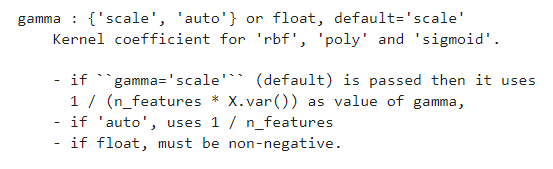

Using the guidance from the default settings, let us now reduce the values of both $C$ and $\gamma$.

In [ ]:
Xtrain.shape

(1034, 9408)

In [ ]:
1 / Xtrain.shape[0]

0.0009671179883945841

In [ ]:
model_svm = SVC(kernel='rbf',
                random_state=42)

In [ ]:
model_pipeline = make_pipeline(StandardScaler(),
                               model_svm)

To tune the hyperparameters of the SVM we create a parameter grid and execute randomized cross-validation.

In [ ]:
param_distrib = {
    "svc__gamma": reciprocal(0.00009, 0.000967),
    "svc__C": uniform(0.1, 1)
}

In [ ]:
rand_search_cv = RandomizedSearchCV(model_pipeline,
                                    param_distrib,
                                    n_iter=50,
                                    cv=3,
                                    random_state=42)

In [ ]:
%%time
rand_search_cv.fit(Xtrain, ytrain)

CPU times: user 13min 18s, sys: 7.69 s, total: 13min 26s
Wall time: 13min 27s


RandomizedSearchCV(cv=3,
                   estimator=Pipeline(steps=[('standardscaler',
                                              StandardScaler()),
                                             ('svc', SVC(random_state=42))]),
                   n_iter=50,
                   param_distributions={'svc__C': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7a433c3b5450>,
                                        'svc__gamma': <scipy.stats._distn_infrastructure.rv_continuous_frozen object at 0x7a433c386650>},
                   random_state=42)

In [ ]:
rand_search_cv.best_estimator_

Pipeline(steps=[('standardscaler', StandardScaler()),
                ('svc',
                 SVC(C=np.float64(0.8712703466859457),
                     gamma=np.float64(0.00010729912168132865),
                     random_state=42))])

In [ ]:
rand_search_cv.best_score_

np.float64(0.7146809347264352)

In [ ]:
rand_search_cv.score(Xtest, ytest)

0.7734375

The SVM gives us a reasonable accuracy for the reduced image size (try changing the image size in the code cells above and notice if there is any impact?)

# Transfer Learning

Now that we have an accuracy baseline from a non deep learning approach has established a baseline, we can look to improve on this by using a deep learning approach.

We begin by resetting the batch size and image size to the original values. Image sizes are often determined by the architecture of the model we are looking to train. A common expected image size for classification problems is $(224, 224)$.

In [ ]:
BATCH_SIZE = 16

IMAGE_SIZE = (224, 224)

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 1034 files belonging to 3 classes.


In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=VALIDATION_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 133 files belonging to 3 classes.


In [ ]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 128 files belonging to 3 classes.


There are two methods through which transfer learning is executed in practise:
1. Freezing weights on large portions of a pretrained neural network and retraining the *'unfrozen'* portions using training data.
2. Slicing out a portion of the initial architecture (*note: no weight import*) of a pretrained neural network, adding dense layers on top and retraining this network using the training data.

In practise, method 1 works better on datasets with classes that are "similar" to the classes the pretrained model was trained on (e.g., Imagenet classes). Method 2 works better on datasets with classes that are very different from the classes that the pretrained model trained on. It is a good practise to start with method 1, shifting to method 2 only when sub par performance is encountered.

## Method 1: Freeze $-$ Unfreeze

### Diving into ResNet50

In [ ]:
base_model = tf.keras.applications.ResNet50(input_shape=(224, 224, 3),
                                            include_top=False,
                                            weights='imagenet')

The input shape specifies the input shape expected for our dataset. `include_top=False` ensures that the final fully connected layers are chopped off. The `weights='imagenet'` parameter allows us to import weights trained on the Imagenet data.

Recall that the foundational components of deep convolutional neural networks are the `Conv2D` layer, the `MaxPool2D` layer and the `Dense` layers (i.e., fully connected layers).



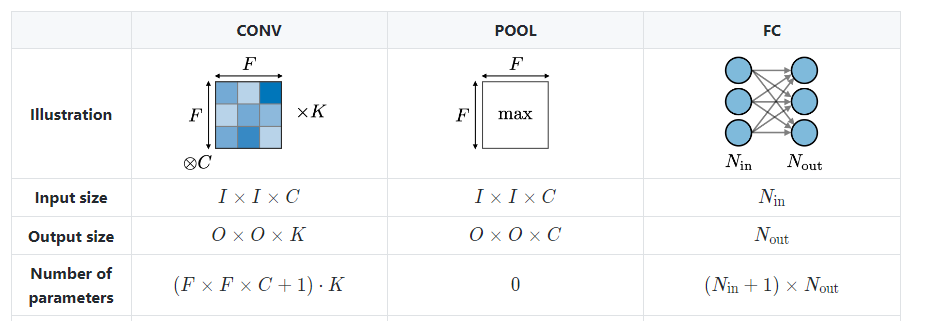

<center>

[Source](https://stanford.edu/~shervine/teaching/cs-230/cheatsheet-convolutional-neural-networks)

</center>

Let us now take a closer look at the ResNet50 architecture.

In [ ]:
base_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

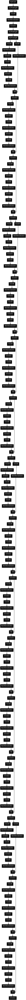

In [ ]:
tf.keras.utils.plot_model(base_model)

A key differentiating aspect of the ResNet architecture is the [Residual Block](https://paperswithcode.com/method/residual-block). This architecture was introduced by [He et. al, 2015](https://arxiv.org/pdf/1512.03385v1.pdf). This architecture was a landmark moment in the history of computer vision. Even today, the ResNet architecture remains one of the most popular models deployed in practise.

Let us zoom into the Residual Layer.

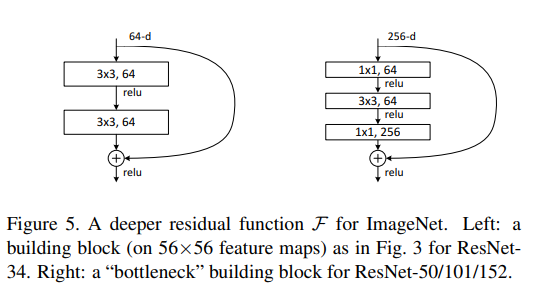

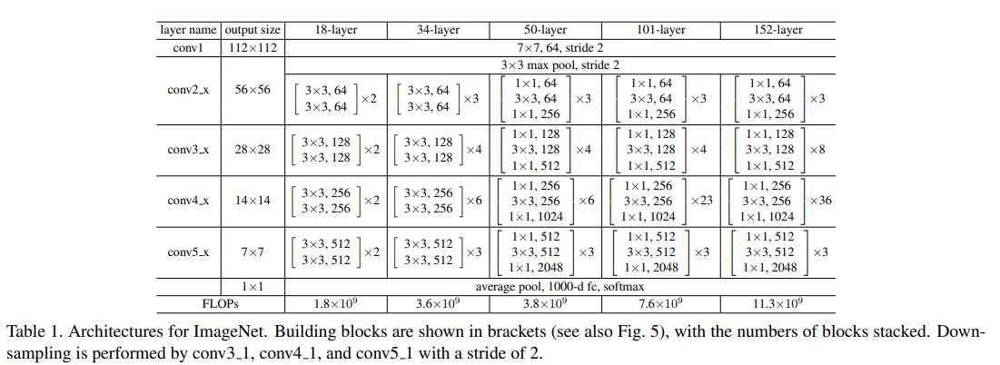

<center>

[Source](https://arxiv.org/pdf/1512.03385v1.pdf)

</center>

Notice how there is a $3 \times 3$ kernel that repeats across the different residual blocks with the number of filters doubling each time. Borrowing inspiration from VGG, as the ResNet goes deeper, the output dimension keeps reducing while the number of filters keeps increasing. For ResNet50 and beyond, $1 \times 1$ convolutions play a key 'bottleneck' role in this architecture (these convolutions also double filters as we go deep). They are bottlenecks because a $1 \times 1$ convolution performs a channel-wise reduction operation similar to a pooling and a $3 \times 3$ filter is sandwiched between two $1 \times 1$ filters. The first set of $1 \times 1$ filters 'squeezes' the input so the $3 \times 3$ filter can effectively be applied while the second $1 \times 1$ filter expands the depth dramatically.

Another innovation that got incorporated here is the [`BatchNormalization`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/BatchNormalization) layer. Batch normalization [stabilizes the model training process tremendously](https://arxiv.org/abs/1502.03167) beyond enabling faster convergence.

### Freeze ResNet50 base

At this point all the weights of the ResNet50 network are imported but can be further trained (total trainable parameters $= 23,534,592$). However, we do not have millions of images for the bean leaf
 classes to train on.

So the next step is to freeze our base model.


In [ ]:
base_model.trainable = False

In [ ]:
base_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_1[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 23,587,712 (89.98 MB)

We build our final model by starting with `Input` layers and adding `Dense` layers as required.

In [ ]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = tf.keras.applications.resnet50.preprocess_input(inputs)

# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning

x = base_model(x, training=False)

x = tf.keras.layers.GlobalAveragePooling2D()(x)
# An alternative option: x = tf.keras.layers.Flatten()(x)

outputs = tf.keras.layers.Dense(3)(x)

As the commented portion of the above code cell indicates, we have two options to collect the output from the convolutional structure of the network - `Flatten` and `GlobalAveragePooling`. When compared to `Flatten`, `GlobalAveragePooling` is more effective in conserving the number of parameters to be estimated.

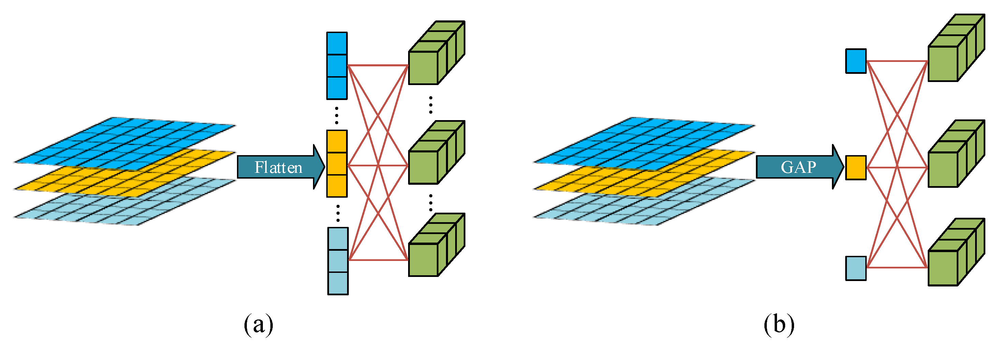

<center>

[Source](https://www.mdpi.com/2072-4292/12/3/396/htm)

</center>

With all the components in place, we build our final model architecture.

In [ ]:
model_resnet50 = tf.keras.Model(inputs, outputs)

In [ ]:
model_resnet50.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 3)         │      6,147 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,593,859 (90.00 MB)

 Trainable params: 6,147 (24.01 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

### Training with frozen base

With the architecture finalized, we can now compile the model. Let us begin by specifying the loss metric to minimize, and the metrics we would track. Since our final layer is `Dense` with no activation, the loss function is defined to be `CategoricalCrossentropy` estimated from logits (i.e., applying sigmoid to the weights from the `Dense` layer (whose default `activation=None`).


In [ ]:
help(tf.keras.losses.CategoricalCrossentropy)

Help on class CategoricalCrossentropy in module keras.src.losses.losses:

class CategoricalCrossentropy(LossFunctionWrapper)
 |  CategoricalCrossentropy(from_logits=False, label_smoothing=0.0, axis=-1, reduction='sum_over_batch_size', name='categorical_crossentropy', dtype=None)
 |  
 |  Computes the crossentropy loss between the labels and predictions.
 |  
 |  Use this crossentropy loss function when there are two or more label
 |  classes. We expect labels to be provided in a `one_hot` representation. If
 |  you want to provide labels as integers, please use
 |  `SparseCategoricalCrossentropy` loss. There should be `num_classes` floating
 |  point values per feature, i.e., the shape of both `y_pred` and `y_true` are
 |  `[batch_size, num_classes]`.
 |  
 |  Args:
 |      from_logits: Whether `y_pred` is expected to be a logits tensor. By
 |          default, we assume that `y_pred` encodes a probability distribution.
 |      label_smoothing: Float in [0, 1]. When > 0, label values a

The categorical crossentropy loss is minimized using the [backpropagation algorithm](https://cs231n.github.io/optimization-2/) using adaptive optimizers such as [Adam](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/Adam).

In [ ]:
model_resnet50.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"]
)

Notice how we have not used any activation for the final dense layer and specified the `from_logits=True` parameter in the loss function. Alternatively, we could have used `activation='softmax'` in the final dense layer and `from_logits=False` in the loss. We do not use this option because pushing the logits to the dense layer can cause numerical instability.


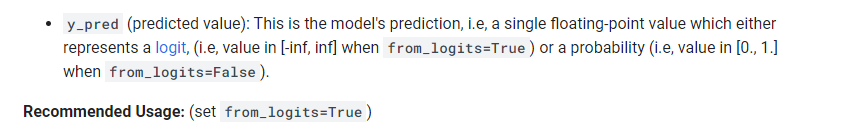

Also, we have used a `learning_rate=1e-4` for Adam, while the default value is `learning_rate=1e-3` (i.e., 10 times slower). Since we are training large neural networks, low learning rates are the norm and not an exception.

In [ ]:
model_resnet50.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 3)         │      6,147 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,593,859 (90.00 MB)

 Trainable params: 6,147 (24.01 KB)

 Non-trainable params: 23,587,712 (89.98 MB)

We have $6,147$ parameters to tune. All these parameters are concentrated in the dense layers since we froze the base ResNet50 network. Before starting the training process, it is a good idea to get a sense of validation accuracy pre-training. This gives us an estimate of baseline performance and will highlight errors in the model compilation process.

In [ ]:
loss_0, acc_0 = model_resnet50.evaluate(val_ds)
print(f"loss {loss_0}, acc {acc_0}")

9/9 ━━━━━━━━━━━━━━━━━━━━ 12s 348ms/step - accuracy: 0.3213 - loss: 1.6140
loss 1.6482337713241577, acc 0.33834585547447205


With many parameters to be estimated, it is a good idea to run the training process for several epochs (i.e., the number of full runthroughs of the data) with a low learning rate. However, training for several hundred epochs if it does not improve accuracy is wasteful. This is where callbacks are so useful.

Two useful callbacks in the context of transfer learning are `ModelCheckPoint` and `EarlyStopping`. If training from scratch, using a [`LearningRateSchedule`](https://www.tensorflow.org/api_docs/python/tf/keras/optimizers/schedules/LearningRateSchedule) or a [Cyclical Learning Rate](https://www.tensorflow.org/addons/tutorials/optimizers_cyclicallearningrate) is also very useful.

In [ ]:
#checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model",
checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model.weights.h5",  # ✅ correct
                                                monitor="val_accuracy",
                                                mode="max",
                                                save_best_only=True,
                                                save_weights_only=True)

earlystopping = tf.keras.callbacks.EarlyStopping(patience=4,
                                                 monitor="val_accuracy",
                                                 restore_best_weights=True)

tensorboard = tf.keras.callbacks.TensorBoard('frozen_resnet50_logs')

> Training in the context of transfer learning is like driving a massive vehicle on a thin road. There are not too many examples and the model is heavy. Slow and steady is the way to go (i.e., less batch size and less learning rate) with checkpoints to guide our way.

The `TensorBoard` callback is extremely useful to monitor the progress of the training effort and profile specific epochs where training seems to be stuck.

In [ ]:
%load_ext tensorboard
%tensorboard --logdir='frozen_resnet50_logs'

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [ ]:
training_history = model_resnet50.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=[checkpoint, earlystopping, tensorboard])

Epoch 1/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 19s 126ms/step - accuracy: 0.3839 - loss: 1.2935 - val_accuracy: 0.5489 - val_loss: 0.9547
Epoch 2/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 80ms/step - accuracy: 0.6304 - loss: 0.8485 - val_accuracy: 0.7519 - val_loss: 0.6988
Epoch 3/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 4s 67ms/step - accuracy: 0.7529 - loss: 0.6726 - val_accuracy: 0.8421 - val_loss: 0.5731
Epoch 4/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 71ms/step - accuracy: 0.7879 - loss: 0.5689 - val_accuracy: 0.8571 - val_loss: 0.4967
Epoch 5/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 70ms/step - accuracy: 0.8148 - loss: 0.5040 - val_accuracy: 0.8647 - val_loss: 0.4408
Epoch 6/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 4s 65ms/step - accuracy: 0.8220 - loss: 0.4577 - val_accuracy: 0.8797 - val_loss: 0.3993
Epoch 7/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 66ms/step - accuracy: 0.8435 - loss: 0.4203 - val_accuracy: 0.8797 - val_loss: 0.3677
Epoch 8/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 5s 65ms/step - accuracy: 0.8677 - loss: 0.3851 - val_accuracy: 

Let us now inspect the training history to extract loss and accuracy for the training and validation data. At this stage the base model is still frozen.

In [ ]:
def plot_acc_loss(training_history):

    train_accuracy = training_history.history['accuracy']
    val_accuracy = training_history.history['val_accuracy']
    training_loss = training_history.history['loss']
    val_loss = training_history.history['val_loss']

    epochs = range(len(train_accuracy))

    plt.figure(figsize=(18, 5))

    plt.subplot(121)

    plt.plot(epochs, train_accuracy, label='training accuracy')
    plt.plot(epochs, val_accuracy, label='validation accuracy')
    plt.title('Training and validation accuracy')
    plt.legend(loc='lower right')

    plt.subplot(122)

    plt.plot(epochs, training_loss, label='training loss')
    plt.plot(epochs, val_loss, label='validation loss')
    plt.legend(loc='upper right')
    plt.title('Training and validation loss')

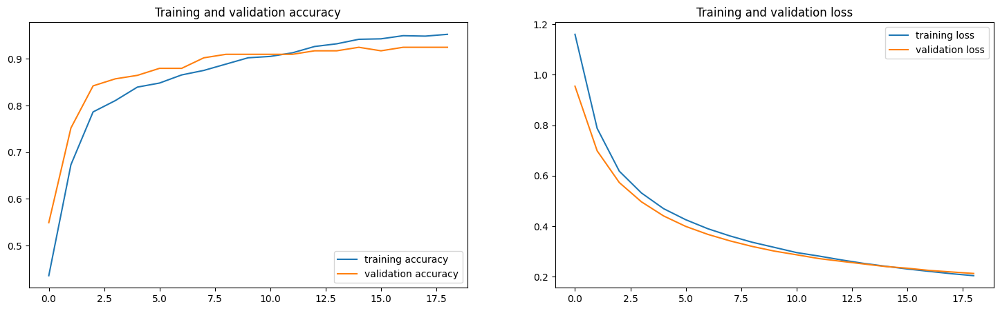

In [ ]:
plot_acc_loss(training_history)

Good validation accuracy by epoch plots will wiggle early on and stabilize over epochs. Too much wiggle all through the training process indicates that either the batch size or the learning rate or both are too high.

With the training in this phase complete, we can load the best weights to our model. At this point, we have the best possible model with frozen weights.

In [ ]:
#model_resnet50.load_weights("best_model")
model_resnet50.load_weights("best_model.weights.h5")

### Unfreeze and retrain

At this point we have a frozen base and the dense layer on top that is tuned for the specific classes in the data. It is now time to unfreeze the base model and retrain all the weights.

In [ ]:
base_model.trainable = True
model_resnet50.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item (GetItem)  │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_1          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ get_item_2          │ (None, 224, 224)  │          0 │ input_layer_2[0]… │
│ (GetItem)           │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ stack (Stack)       │ (None, 224, 224,  │          0 │ get_item[0][0],   │
│                     │ 3)                │            │ get_item_1[0][0], │
│                     │                   │            │ get_item_2[0][0]  │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ add (Add)           │ (None, 224, 224,  │          0 │ stack[0][0]       │
│                     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ resnet50            │ (None, 7, 7,      │ 23,587,712 │ add[0][0]         │
│ (Functional)        │ 2048)             │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ global_average_poo… │ (None, 2048)      │          0 │ resnet50[0][0]    │
│ (GlobalAveragePool… │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 3)         │      6,147 │ global_average_p… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 23,606,155 (90.05 MB)

 Trainable params: 23,540,739 (89.80 MB)

 Non-trainable params: 53,120 (207.50 KB)

 Optimizer params: 12,296 (48.04 KB)

Now we can see that we have $23,540,739$ parameters to train. Set up checkpoints once again to recover the best model.

In [ ]:
#checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model",
checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model.weights.h5",  # ✅ correct
                                                monitor="val_accuracy",
                                                mode="max",
                                                save_best_only=True,
                                                save_weights_only=True)

earlystopping = tf.keras.callbacks.EarlyStopping(patience=4,
                                                 monitor="val_accuracy",
                                                 restore_best_weights=True)

Recompile the model with a much lower learning rate (lot more parameters to learn and we do not want to disrput the original weights too much).

In [ ]:
model_resnet50.compile(
    optimizer=tf.keras.optimizers.Adam(1e-6),  # Lower learning rate
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=['accuracy'])

Retrain, now with the unfrozen base.

In [ ]:
training_history = model_resnet50.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=[checkpoint, earlystopping]
)

Epoch 1/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 103s 717ms/step - accuracy: 0.7051 - loss: 0.6723 - val_accuracy: 0.9173 - val_loss: 0.3006
Epoch 2/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 12s 182ms/step - accuracy: 0.7511 - loss: 0.5372 - val_accuracy: 0.8647 - val_loss: 0.3445
Epoch 3/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 12s 187ms/step - accuracy: 0.8497 - loss: 0.4125 - val_accuracy: 0.8571 - val_loss: 0.3635
Epoch 4/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 20s 177ms/step - accuracy: 0.8849 - loss: 0.3641 - val_accuracy: 0.8647 - val_loss: 0.3518
Epoch 5/100
65/65 ━━━━━━━━━━━━━━━━━━━━ 21s 179ms/step - accuracy: 0.8802 - loss: 0.3355 - val_accuracy: 0.8647 - val_loss: 0.3338


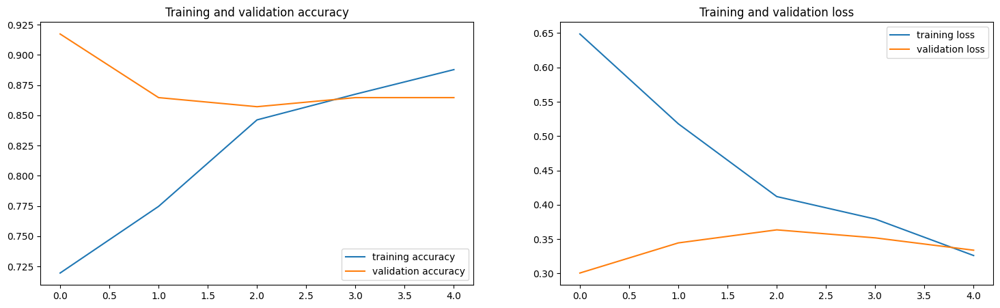

In [ ]:
plot_acc_loss(training_history)

Load the best model as our final, fully tuned model and estimate the validation accuracy one last time. **Never run evaluate on test data more than once.**

In [ ]:
#model_resnet50.load_weights("best_model")
model_resnet50.load_weights("best_model.weights.h5")

In [ ]:
loss, acc = model_resnet50.evaluate(test_ds)
print(f"final loss {loss}, final acc {acc}")

8/8 ━━━━━━━━━━━━━━━━━━━━ 1s 74ms/step - accuracy: 0.8983 - loss: 0.2740
final loss 0.28505754470825195, final acc 0.8984375


In [ ]:
#model_resnet50.save("bean-leaf-predictor-resnet50")
model_resnet50.save("bean-leaf-predictor-resnet50.keras")

In [ ]:
#!zip -r bean-leaf-predictor-resnet50.zip bean-leaf-predictor-resnet50/
!zip bean-leaf-predictor-resnet50.zip bean-leaf-predictor-resnet50.keras


  adding: bean-leaf-predictor-resnet50.keras (deflated 9%)


## Method 2: Slice $-$ Train

Another method to employ transfer learning is to slice a portion of the base network and train this portion with some `Dense` layers tagged on to this base network. Let us see how this is done with the ResNet50 as the base.

In [ ]:
BATCH_SIZE = 16
IMAGE_SIZE = (224, 224)

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 1034 files belonging to 3 classes.


In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=VALIDATION_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 133 files belonging to 3 classes.


In [ ]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

Found 128 files belonging to 3 classes.


### Slice ResNet50 base


In [ ]:
base_model = tf.keras.applications.ResNet50(input_shape=(224, 224, 3),
                                            include_top=False,
                                            weights=None)

In [ ]:
base_model.summary()

Model: "resnet50"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 23,587,712 (89.98 MB)

 Trainable params: 23,534,592 (89.78 MB)

 Non-trainable params: 53,120 (207.50 KB)

In [ ]:
base_model = tf.keras.Model(base_model.inputs,
                            outputs=[base_model.get_layer("conv3_block4_out").output])

Notice how we are constraining the base model to cover only the firt three ResNet blocks.

In [ ]:
base_model.summary()

Model: "functional_2"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_4       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_4[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 1,460,096 (5.57 MB)

 Trainable params: 1,449,984 (5.53 MB)

 Non-trainable params: 10,112 (39.50 KB)

We are cutting off the ResNet50 architecture after the first two convolution blocks. The intuition here is that the layers closest to the input learn more generalizable feature representations. Layers that are further away from the input learn data specific feature representations. There are no specific guiding principles on where to cut the architecture off. This is a call made based on the size of the dataset we have and the compute on hand to train these networks.

In [ ]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = tf.keras.applications.resnet50.preprocess_input(inputs)

x = base_model(x)
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(3)(x)

model_resnet50 = tf.keras.Model(inputs, outputs)

ValueError: Layer "dense_2" expects 1 input(s), but it received 2 input tensors. Inputs received: [<KerasTensor shape=(None, 28, 28, 512), dtype=float32, sparse=False, name=keras_tensor_543>, <KerasTensor shape=(None, 28, 28, 512), dtype=float32, sparse=False, name=keras_tensor_544>]

### Training

The rest of the model training pipeline is exactly identical to the freeze-unfreeze case discussed in the previous section. Since we do not import any pretrained weights, there is only one round of training.

In [ ]:
model_resnet50.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-5),
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"]
)

In [ ]:
model_resnet50.summary()

In [ ]:
loss_0, acc_0 = model_resnet50.evaluate(val_ds)
print(f"loss {loss_0}, acc {acc_0}")

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model",
                                                monitor="val_accuracy",
                                                mode="max",
                                                save_best_only=True,
                                                save_weights_only=True)

earlystopping = tf.keras.callbacks.EarlyStopping(patience=3,
                                                 monitor="val_accuracy",
                                                 restore_best_weights=True)

In [ ]:
training_history = model_resnet50.fit(train_ds,
                                      validation_data=val_ds,
                                      epochs=100,
                                      callbacks=[checkpoint, earlystopping])

In [ ]:
plot_acc_loss(training_history)

> **Question(s): If you change the batch size for this ResNet example to 32 will it increase increase accuracy? How about decreasing the batch size to 8? What about the learning rate?**

In [ ]:
model_resnet50.load_weights("best_model")

In [ ]:
loss, acc = model_resnet50.evaluate(test_ds)
print(f"final loss {loss}, final acc {acc}")

> **Question(s): Why do you think Freeze-Unfreeze worked better than Slice-Train? How would you improve the accuracy of this method?**

## Points to remember

- Batch size and learning rate help control the efficacy of learning. Slow incremental decreases in loss are vital signs of effective learning.
- Always look at the initial loss/accuracy before starting the training process.
- Train for large number of epochs, but use early stopping.
- Before unfreezing the base model or using a larger slice of the base model, see if adding dense layers at the top increases performance.
- **CAUTION: In method 1, when using a base model with `BatchNormalization` layers, it is critical that the parameter `training=False` is set. This ensures that no data leaks from the test data to the training process**
- **Patience** is key 😀 🧘



The current state of model accuracy for image classification.

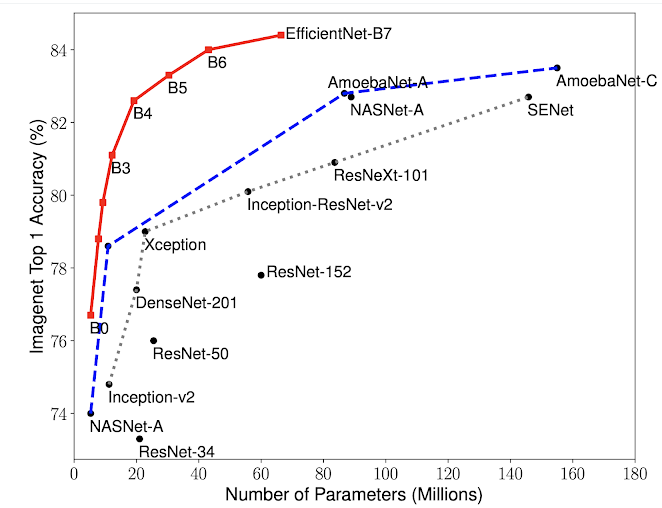

<center>

[Source](https://ai.googleblog.com/2019/05/efficientnet-improving-accuracy-and.html)

</center>

# Exercise

Annotate the free-unfreeze code below to train an [EfficientNet](https://arxiv.org/abs/1905.11946) model on the bean leaf data set. You should discuss:

- [Specific architectural features](https://ai.googleblog.com/2019/05/efficientnet-improving-accuracy-and.html) of the base model
- Why is this model termed 'efficient' (Hint: it uses an [inverted residual block](https://towardsdatascience.com/mobilenetv2-inverted-residuals-and-linear-bottlenecks-8a4362f4ffd5) with a [`DepthwiseConv2D`](https://www.tensorflow.org/api_docs/python/tf/keras/layers/DepthwiseConv2D) layer at its heart)?
- Appropriateness of the parameters used in the code below (e.g., batch size, learning rate)

In [ ]:
TRAINING_DIR = '/tmp/bean/train'
VALIDATION_DIR = '/tmp/bean/validation'
TEST_DIR = '/tmp/bean/test'

BATCH_SIZE = 16

IMAGE_SIZE = (224, 224)

In [ ]:
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TRAINING_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

In [ ]:
val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=VALIDATION_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

In [ ]:
test_ds = tf.keras.preprocessing.image_dataset_from_directory(
    directory=TEST_DIR,
    labels='inferred',
    label_mode='categorical',
    class_names=['angular_leaf_spot', 'bean_rust', 'healthy'],
    batch_size=BATCH_SIZE,
    image_size=IMAGE_SIZE,
    shuffle=True,
    seed=42
)

In [ ]:
base_model = tf.keras.applications.EfficientNetB0(input_shape=(224, 224, 3),
                                                  include_top=False,
                                                  weights='imagenet')

In [ ]:
base_model.summary()

In [ ]:
tf.keras.utils.plot_model(base_model)

In [ ]:
base_model.trainable = False

In [ ]:
base_model.summary()

In [ ]:
inputs = tf.keras.Input(shape=(224, 224, 3))
x = tf.keras.applications.efficientnet.preprocess_input(inputs)

# We make sure that the base_model is running in inference mode here,
# by passing `training=False`. This is important for fine-tuning

x = base_model(x, training=False)

x = tf.keras.layers.GlobalAveragePooling2D()(x)

outputs = tf.keras.layers.Dense(3)(x)

In [ ]:
model_efficientnet = tf.keras.Model(inputs, outputs)

In [ ]:
model_efficientnet.summary()

In [ ]:
model_efficientnet.compile(
    optimizer=tf.keras.optimizers.Adam(learning_rate=1e-4),
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=["accuracy"]
)

In [ ]:
loss_0, acc_0 = model_efficientnet.evaluate(val_ds)
print(f"loss {loss_0}, acc {acc_0}")

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model",
                                                monitor="val_accuracy",
                                                mode="max",
                                                save_best_only=True,
                                                save_weights_only=True)

earlystopping = tf.keras.callbacks.EarlyStopping(patience=4,
                                                 monitor="val_accuracy",
                                                 restore_best_weights=True)

In [ ]:
training_history = model_efficientnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=[checkpoint, earlystopping]
)

In [ ]:
plot_acc_loss(training_history)

In [ ]:
model_efficientnet.load_weights("best_model")

In [ ]:
base_model.trainable = True
model_efficientnet.summary()

In [ ]:
checkpoint = tf.keras.callbacks.ModelCheckpoint("best_model",
                                                monitor="val_accuracy",
                                                mode="max",
                                                save_best_only=True,
                                                save_weights_only=True)

earlystopping = tf.keras.callbacks.EarlyStopping(patience=4,
                                                 monitor="val_accuracy",
                                                 restore_best_weights=True)

In [ ]:
model_efficientnet.compile(
    optimizer=tf.keras.optimizers.Adam(1e-6),  # Low learning rate
    loss=tf.keras.losses.CategoricalCrossentropy(from_logits=True),
    metrics=['accuracy']
)

In [ ]:
training_history = model_efficientnet.fit(
    train_ds,
    validation_data=val_ds,
    epochs=100,
    callbacks=[checkpoint, earlystopping]
)

In [ ]:
model_efficientnet.load_weights("best_model")

In [ ]:
loss, acc = model_efficientnet.evaluate(test_ds)
print(f"final loss {loss}, final acc {acc}")